___
# Welcome to a notebook on implementing cycleGAN

We will explore how to transform human faces into anime faces. To get started upload the following two directories into your working environment.  

*url for file downloads*
    
1. http://homepages.cs.ncl.ac.uk/stephen.mcgough/Teaching/PubFig.zip
2. http://homepages.cs.ncl.ac.uk/stephen.mcgough/Teaching/anime.zip


Follow the first part of the notebook to set-up your file system with the correct structure. This is intended for one time use. 

Once the file structure is set up in the correct way you can follow the code through. The code is not designed to be run in a linear fashion, the batch sizes and input image sizes in the *image_dataset_from_directory* functions have been ammended and re-ran within the various blocks.
These changes are all detailed at the section headers of each run to make the analysis reproducible. 

If you simply want to use the trained model to make some predictions then the final model weights will be saved alongside this notebook. Make sure it is saved to your current working directory
and you can simply load any human faces into a directory, then load the model weights into the architecture and generate some anime lookalikes! 


Enjoy! 
___ 

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import cv2
import tensorflow as tf
import zipfile
import os 
import shutil

In [2]:
import tensorflow as tf
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


___ 
## Sorting out the file system for Keras 

In [3]:
f = zipfile.ZipFile('PubFig.zip')
g = zipfile.ZipFile('anime.zip')

# extract the files into you current directory: (this may take a while)
f.extractall('.')
g.extractall('.')

f.close()
g.close()

We require a code structure like this:

1. Anime

 -Train
 -Test

2. Celebs

 -Train
 -Test

Thus we must first write some code to extract all of the celeb faces out of their respective subfolders. Once we have that structure we can work on creating the train and test sets for the domian and target. 

In [93]:
os.getcwd()

'/mnt/batch/tasks/shared/LS_root/mounts/clusters/compute-csc8637-a8278786/code/Users/j.stelling2'

In [94]:
import os
import cv2

# for the following  code we must be the file structure working directory:
# e.g. '/mnt/batch/tasks/shared/LS_root/mounts/clusters/compute-csc8637-a8278786/code/Users/j.stelling2'

directory = './CelebDataProcessed'
new_directory = './Celebs'

# If dir does not exist otherwise delete next line
os.mkdir(new_directory)

def copy_images():

    for file_name in os.listdir(directory):
        sub_dir_path = directory + '/' + file_name
        if (os.path.isdir(sub_dir_path)):
            for image_name in os.listdir(sub_dir_path):
                if image_name[-4:] == '.jpg':
                    img = cv2.imread(sub_dir_path +'/'+ image_name)
                    copied_image_path = file_name + image_name
                    os.chdir(new_directory)
                    cv2.imwrite(copied_image_path, img)
                    os.chdir('..')
    print('file structure created')

copy_images()

file structure created


In [97]:
# Get a count of how many files we have in each folder, Celebs and images.

print('number of celeb faces in original directory', len(glob.glob('./CelebDataProcessed/*/*.jpg')) )
print('number of celeb faces in the new directory', len(glob.glob('./Celebs/*.jpg')) )
print('number of anime faces', len(glob.glob('./images/*.jpg')) )

number of celeb faces in original directory 11640
number of celeb faces in the new directory 11640
number of anime faces 46664


In [ ]:
import shutil

# Remove the old structure once we've transferred the images

#os.getcwd()
#os.chdir('..')
shutil.rmtree('./CelebDataProcessed')

## Another file structure change so we can use image_flow_from_directory. 

In [3]:
import os
import numpy as np
import shutil

# # Creating Train / Val / Test folders (One time use!)
root_dir = './HumanAnime'
posCls = '/Celebs'
negCls = '/Anime'
target_dir = './HumanAnimeResplit'

os.makedirs(target_dir)

os.makedirs(target_dir + '/train_anime' + negCls )
os.makedirs(target_dir + '/test_anime' + negCls)

os.makedirs(target_dir + '/train_human' + posCls )
os.makedirs(target_dir + '/test_human' + posCls )

# Creating partitions of the data after shuffeling
classes = [negCls, posCls]

for currentCls in classes:

    src = root_dir + currentCls # Folder to copy images from

    allFileNames = os.listdir(src)
    np.random.shuffle(allFileNames)
    train_FileNames,  test_FileNames = np.split(np.array(allFileNames),
                                                [int(len(allFileNames)*0.8)])

    train_FileNames = [src + '/' + name for name in train_FileNames.tolist()]
    test_FileNames = [src + '/'  + name for name in test_FileNames.tolist()]

    print(f'Total images for {currentCls}: ',  len(allFileNames))
    print(f'Training images in {currentCls}: ', len(train_FileNames))
    print(f'Testing images in {currentCls}: ', len(test_FileNames))
    print('-------------------------------------------------------')


    # Copy-pasting images
    if currentCls == posCls : 
        
        for name in train_FileNames:
            shutil.copy(name, target_dir + '/train_human' + currentCls  )

        for name in test_FileNames:
            shutil.copy(name, target_dir + '/test_human' + currentCls )

    if currentCls == negCls : 
        
        for name in train_FileNames:
            shutil.copy(name, target_dir + '/train_anime' + currentCls )

        for name in test_FileNames:
            shutil.copy(name, target_dir + '/test_anime' + currentCls )

print('Split Successful!')

Total images for /Anime:  46664
Training images in /Anime:  37331
Testing images in /Anime:  9333
-------------------------------------------------------
Split Successful!


___
## Once the file structure is set-up as instructed above start here:

## Set up dataframes for the cycleGAN code


In [21]:
print(tf.__version__)

2.3.0


In [2]:
# If tensorflow addons isnt wokring use the pip install command below. 
# !pip install tensorflow-addons


import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

import tensorflow_addons as tfa
# import tensorflow_datasets as tfds

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# tfds.disable_progress_bar()
autotune = tf.data.experimental.AUTOTUNE

### Image dataset from directory commands to read in data, without labels

- batch size of 32 produced oom error
- trying batch size 16 ... same again OOM error
- we can try and reduce the input image size to 128,128

In [30]:
train_anime = tf.keras.preprocessing.image_dataset_from_directory(
                        './HumanAnimeResplit/train_anime',
                        labels="inferred",
                        label_mode=None,
                        class_names=['Anime'],
                        color_mode="rgb",
                        batch_size=32,
                        image_size=(64,64),
                        shuffle=True,
                        seed=118,
                        validation_split=None,
                        subset=None,
                        interpolation="bilinear",
                        follow_links=False,
                    )

test_anime = tf.keras.preprocessing.image_dataset_from_directory(
                        './HumanAnimeResplit/test_anime',
                        labels="inferred",
                        label_mode=None,
                        class_names=['Anime'],
                        color_mode="rgb",
                        batch_size=32,
                        image_size=(64,64),
                        shuffle=True,
                        seed=118,
                        validation_split=None,
                        subset=None,
                        interpolation="bilinear",
                        follow_links=False,
                    )



train_human = tf.keras.preprocessing.image_dataset_from_directory(
                        './HumanAnimeResplit/train_human',
                        label_mode=None,
                        class_names=['Celebs'],
                        color_mode="rgb",
                        batch_size=32,
                        image_size=(64,64),
                        shuffle=True,
                        seed=118,
                        validation_split=None,
                        subset=None,
                        interpolation="bilinear",
                        follow_links=False,
                    )

test_human = tf.keras.preprocessing.image_dataset_from_directory(
                        './HumanAnimeResplit/test_human',
                        label_mode=None,
                        class_names=['Celebs'],
                        color_mode="rgb",
                        batch_size=32,
                        image_size=(64,64),
                        shuffle=True,
                        seed=118,
                        validation_split=None,
                        subset=None,
                        interpolation="bilinear",
                        follow_links=False,
                    )


Found 37331 files belonging to 1 classes.
Found 9333 files belonging to 1 classes.
Found 9312 files belonging to 1 classes.
Found 2328 files belonging to 1 classes.


## Here we take a much smaller sample size in the hope to train for longer. If we get 1000 anime faces and 1000 celebrity faces we should have enough diversity to be able to train the model for longer and achieve better results!

We implement this approach from Run 3 onwards. Seeds for each run are given in the comment at the bottom of this block. 

In [22]:
train_anime = tf.keras.preprocessing.image_dataset_from_directory(
                        './HumanAnimeResplit/train_anime',
                        labels="inferred",
                        label_mode=None,
                        class_names=['Anime'],
                        color_mode="rgb",
                        batch_size=2,
                        image_size=(128,128),
                        shuffle=True,
                        seed=300,
                        validation_split=0.90,  ## 10% training and 90% testing. This gives around 3700 images to train with, which is plenty
                        subset='training',
                        interpolation="bilinear",
                        follow_links=False,
                    )

test_anime = tf.keras.preprocessing.image_dataset_from_directory(
                        './HumanAnimeResplit/test_anime',
                        labels="inferred",
                        label_mode=None,
                        class_names=['Anime'],
                        color_mode="rgb",
                        batch_size=2,
                        image_size=(128,128),
                        shuffle=True,
                        seed=300,
                        validation_split=0.80,  ## 20% training 80% testing. This gives us 1800 images use as test_anime confusingly accessed via the training portion 
                        subset='training',
                        interpolation="bilinear",
                        follow_links=False,
                    )



train_human = tf.keras.preprocessing.image_dataset_from_directory(
                        './HumanAnimeResplit/train_human',
                        label_mode=None,
                        class_names=['Celebs'],
                        color_mode="rgb",
                        batch_size=2,
                        image_size=(128,128),
                        shuffle=True,
                        seed=300,
                        validation_split=0.70, ## 30% training and 70% testing. This sives 3000 human faces to train with. 
                        subset='training',
                        interpolation="bilinear",
                        follow_links=False,
                    )

test_human = tf.keras.preprocessing.image_dataset_from_directory(
                        './HumanAnimeResplit/test_human',
                        label_mode=None,
                        class_names=['Celebs'],
                        color_mode="rgb",
                        batch_size=2,
                        image_size=(128,128),
                        shuffle=True,
                        seed=400,
                        validation_split=0.60,  ## Gives 920 human faces to test with. (Accessed with training = True) confusingly.
                        subset='training',
                        interpolation="bilinear",
                        follow_links=False,
                    )

# Seeds used on each run: Run1 : 118, Run2: 118 ,  Run3: 18, Run4: 8, Run5: 2 Run6: 200, Run7: 300
 
# We could have used this split from the initial file structure in which case we could use the other portion for testing. 
# This methods allows more flexibility in selecting a much further reduced subset of data. We are also gaurenteed no overlap in data since folders are already split. 

Found 37331 files belonging to 1 classes.
Using 3734 files for training.
Found 9333 files belonging to 1 classes.
Using 1867 files for training.
Found 9312 files belonging to 1 classes.
Using 2794 files for training.
Found 2328 files belonging to 1 classes.
Using 932 files for training.


# Data augmenters for our data

In [4]:
from tensorflow.keras.layers.experimental import preprocessing

data_augmentation_train = keras.Sequential(
    [
        preprocessing.RandomFlip("horizontal"),
        preprocessing.Resizing(128,128),
        #preprocessing.RandomCrop(256,256),
        preprocessing.Rescaling(scale = 1./127.5 , offset = -1 )

    ]
)

data_augmentation_test = keras.Sequential(
    [
        preprocessing.Resizing(128,128),
        preprocessing.Rescaling(scale = 1./127.5 , offset = -1 )
    ]
)

In [5]:
# Define the standard image size.
# orig_img_size = (286, 286)
# Size of the random crops to be used during training.
input_img_size = (128, 128, 3)

# Weights initializer for the layers.
kernel_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)
# Gamma initializer for instance normalization.
gamma_init = keras.initializers.RandomNormal(mean=0.0, stddev=0.02)

#buffer_size = 256
#batch_size = 32

## 2 X Augmneted data lambda function **without** labels **with** validation split

In [23]:
augmented_train_anime = train_anime.map(
  lambda x: (data_augmentation_train(x, training = True)))

augmented_train_human = train_human.map(
  lambda x: (data_augmentation_train(x, training = True)))


augmented_test_anime = test_anime.map(
  lambda x: (data_augmentation_test(x, training = True)))

augmented_test_human = test_human.map(
  lambda x: (data_augmentation_test(x, training = True)))

## NB We use training = true in all cases becuase we are selecting the train portion of the split we created. 

### Visualize some samples

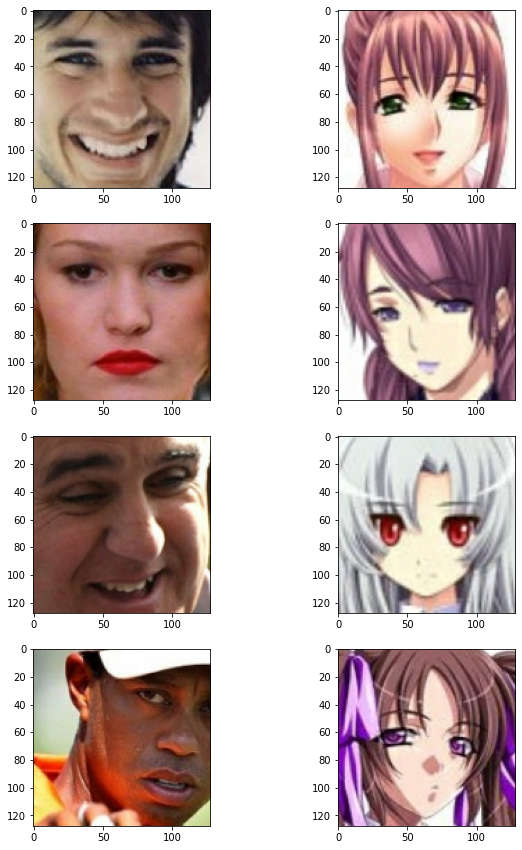

In [7]:
_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, samples in enumerate(zip(augmented_train_human.take(4), augmented_train_anime.take(4))):
    human = (((samples[0][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    anime = (((samples[1][0] * 127.5) + 127.5).numpy()).astype(np.uint8)
    ax[i, 0].imshow(human)
    ax[i, 1].imshow(anime)
plt.show()

## This worked with Amirs image data gen with no labels and the augmenting fuction with no y. 

### Building blocks used in the CycleGAN generators and discriminators

In [7]:
class ReflectionPadding2D(layers.Layer):
    """Implements Reflection Padding as a layer.

    Args:
        padding(tuple): Amount of padding for the
        spatial dimensions.

    Returns:
        A padded tensor with the same type as the input tensor.
    """

    def __init__(self, padding=(1, 1), **kwargs):
        self.padding = tuple(padding)
        super(ReflectionPadding2D, self).__init__(**kwargs)

    def call(self, input_tensor, mask=None):
        padding_width, padding_height = self.padding
        padding_tensor = [
            [0, 0],
            [padding_height, padding_height],
            [padding_width, padding_width],
            [0, 0],
        ]
        return tf.pad(input_tensor, padding_tensor, mode="REFLECT")


def residual_block(
    x,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(1, 1),
    padding="valid",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    dim = x.shape[-1]
    input_tensor = x

    x = ReflectionPadding2D()(input_tensor)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = activation(x)

    x = ReflectionPadding2D()(x)
    x = layers.Conv2D(
        dim,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.add([input_tensor, x])
    return x


def downsample(
    x,
    filters,
    activation,
    kernel_initializer=kernel_init,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2D(
        filters,
        kernel_size,
        strides=strides,
        kernel_initializer=kernel_initializer,
        padding=padding,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


def upsample(
    x,
    filters,
    activation,
    kernel_size=(3, 3),
    strides=(2, 2),
    padding="same",
    kernel_initializer=kernel_init,
    gamma_initializer=gamma_init,
    use_bias=False,
):
    x = layers.Conv2DTranspose(
        filters,
        kernel_size,
        strides=strides,
        padding=padding,
        kernel_initializer=kernel_initializer,
        use_bias=use_bias,
    )(x)
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    if activation:
        x = activation(x)
    return x


### Build the generators

The generator consists of downsampling blocks: nine residual blocks and upsampling blocks. The structure of the generator is the following:

In [8]:
def get_resnet_generator(
    filters=64,
    num_downsampling_blocks=2,
    num_residual_blocks=9,
    num_upsample_blocks=2,
    gamma_initializer=gamma_init,
    name=None,
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = ReflectionPadding2D(padding=(3, 3))(img_input)
    x = layers.Conv2D(filters, (7, 7), kernel_initializer=kernel_init, use_bias=False)(
        x
    )
    x = tfa.layers.InstanceNormalization(gamma_initializer=gamma_initializer)(x)
    x = layers.Activation("relu")(x)

    # Downsampling
    for _ in range(num_downsampling_blocks):
        filters *= 2
        x = downsample(x, filters=filters, activation=layers.Activation("relu"))

    # Residual blocks
    for _ in range(num_residual_blocks):
        x = residual_block(x, activation=layers.Activation("relu"))

    # Upsampling
    for _ in range(num_upsample_blocks):
        filters //= 2
        x = upsample(x, filters, activation=layers.Activation("relu"))

    # Final block
    x = ReflectionPadding2D(padding=(3, 3))(x)
    x = layers.Conv2D(3, (7, 7), padding="valid")(x)
    x = layers.Activation("tanh")(x)

    model = keras.models.Model(img_input, x, name=name)
    return model


### Build the discriminators

The discriminators implement the following architecture: C64->C128->C256->C512

In [9]:
def get_discriminator(
    filters=64, kernel_initializer=kernel_init, num_downsampling=3, name=None
):
    img_input = layers.Input(shape=input_img_size, name=name + "_img_input")
    x = layers.Conv2D(
        filters,
        (4, 4),
        strides=(2, 2),
        padding="same",
        kernel_initializer=kernel_initializer,
    )(img_input)
    x = layers.LeakyReLU(0.2)(x)

    num_filters = filters
    for num_downsample_block in range(3):
        num_filters *= 2
        if num_downsample_block < 2:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(2, 2),
            )
        else:
            x = downsample(
                x,
                filters=num_filters,
                activation=layers.LeakyReLU(0.2),
                kernel_size=(4, 4),
                strides=(1, 1),
            )

    x = layers.Conv2D(
        1, (4, 4), strides=(1, 1), padding="same", kernel_initializer=kernel_initializer
    )(x)

    model = keras.models.Model(inputs=img_input, outputs=x, name=name)
    return model


# Get the generators
gen_G = get_resnet_generator(name="generator_G")
gen_F = get_resnet_generator(name="generator_F")

# Get the discriminators
disc_X = get_discriminator(name="discriminator_X")
disc_Y = get_discriminator(name="discriminator_Y")

### Build the CycleGAN model

We will override the train_step() method of the Model class for training via fit()

In [10]:
class CycleGan(keras.Model):
    def __init__(
        self,
        generator_G,
        generator_F,
        discriminator_X,
        discriminator_Y,
        lambda_cycle=10.0,
        lambda_identity=0.5,
    ):
        super(CycleGan, self).__init__()
        self.gen_G = generator_G
        self.gen_F = generator_F
        self.disc_X = discriminator_X
        self.disc_Y = discriminator_Y
        self.lambda_cycle = lambda_cycle
        self.lambda_identity = lambda_identity

    def compile(
        self,
        gen_G_optimizer,
        gen_F_optimizer,
        disc_X_optimizer,
        disc_Y_optimizer,
        gen_loss_fn,
        disc_loss_fn,
    ):
        super(CycleGan, self).compile()
        self.gen_G_optimizer = gen_G_optimizer
        self.gen_F_optimizer = gen_F_optimizer
        self.disc_X_optimizer = disc_X_optimizer
        self.disc_Y_optimizer = disc_Y_optimizer
        self.generator_loss_fn = gen_loss_fn
        self.discriminator_loss_fn = disc_loss_fn
        self.cycle_loss_fn = keras.losses.MeanAbsoluteError()
        self.identity_loss_fn = keras.losses.MeanAbsoluteError()

    def train_step(self, batch_data):
        # x is Horse and y is zebra
        real_x, real_y = batch_data

        # For CycleGAN, we need to calculate different
        # kinds of losses for the generators and discriminators.
        # We will perform the following steps here:
        #
        # 1. Pass real images through the generators and get the generated images
        # 2. Pass the generated images back to the generators to check if we
        #    we can predict the original image from the generated image.
        # 3. Do an identity mapping of the real images using the generators.
        # 4. Pass the generated images in 1) to the corresponding discriminators.
        # 5. Calculate the generators total loss (adverserial + cycle + identity)
        # 6. Calculate the discriminators loss
        # 7. Update the weights of the generators
        # 8. Update the weights of the discriminators
        # 9. Return the losses in a dictionary

        with tf.GradientTape(persistent=True) as tape:
            # Horse to fake zebra
            fake_y = self.gen_G(real_x, training=True)
            # Zebra to fake horse -> y2x
            fake_x = self.gen_F(real_y, training=True)

            # Cycle (Horse to fake zebra to fake horse): x -> y -> x
            cycled_x = self.gen_F(fake_y, training=True)
            # Cycle (Zebra to fake horse to fake zebra) y -> x -> y
            cycled_y = self.gen_G(fake_x, training=True)

            # Identity mapping
            same_x = self.gen_F(real_x, training=True)
            same_y = self.gen_G(real_y, training=True)

            # Discriminator output
            disc_real_x = self.disc_X(real_x, training=True)
            disc_fake_x = self.disc_X(fake_x, training=True)

            disc_real_y = self.disc_Y(real_y, training=True)
            disc_fake_y = self.disc_Y(fake_y, training=True)

            # Generator adverserial loss
            gen_G_loss = self.generator_loss_fn(disc_fake_y)
            gen_F_loss = self.generator_loss_fn(disc_fake_x)

            # Generator cycle loss
            cycle_loss_G = self.cycle_loss_fn(real_y, cycled_y) * self.lambda_cycle
            cycle_loss_F = self.cycle_loss_fn(real_x, cycled_x) * self.lambda_cycle

            # Generator identity loss
            id_loss_G = (
                self.identity_loss_fn(real_y, same_y)
                * self.lambda_cycle
                * self.lambda_identity
            )
            id_loss_F = (
                self.identity_loss_fn(real_x, same_x)
                * self.lambda_cycle
                * self.lambda_identity
            )

            # Total generator loss
            total_loss_G = gen_G_loss + cycle_loss_G + id_loss_G
            total_loss_F = gen_F_loss + cycle_loss_F + id_loss_F

            # Discriminator loss
            disc_X_loss = self.discriminator_loss_fn(disc_real_x, disc_fake_x)
            disc_Y_loss = self.discriminator_loss_fn(disc_real_y, disc_fake_y)

        # Get the gradients for the generators
        grads_G = tape.gradient(total_loss_G, self.gen_G.trainable_variables)
        grads_F = tape.gradient(total_loss_F, self.gen_F.trainable_variables)

        # Get the gradients for the discriminators
        disc_X_grads = tape.gradient(disc_X_loss, self.disc_X.trainable_variables)
        disc_Y_grads = tape.gradient(disc_Y_loss, self.disc_Y.trainable_variables)

        # Update the weights of the generators
        self.gen_G_optimizer.apply_gradients(
            zip(grads_G, self.gen_G.trainable_variables)
        )
        self.gen_F_optimizer.apply_gradients(
            zip(grads_F, self.gen_F.trainable_variables)
        )

        # Update the weights of the discriminators
        self.disc_X_optimizer.apply_gradients(
            zip(disc_X_grads, self.disc_X.trainable_variables)
        )
        self.disc_Y_optimizer.apply_gradients(
            zip(disc_Y_grads, self.disc_Y.trainable_variables)
        )

        return {
            "G_loss": total_loss_G,
            "F_loss": total_loss_F,
            "D_X_loss": disc_X_loss,
            "D_Y_loss": disc_Y_loss,
        }


### Create a callback that periodically saves generated images

In [11]:
class GANMonitor(keras.callbacks.Callback):
    """A callback to generate and save images after each epoch"""

    def __init__(self, num_img=4):
        self.num_img = num_img

    def on_epoch_end(self, epoch, logs=None):
        _, ax = plt.subplots(4, 2, figsize=(12, 12))
        for i, img in enumerate(augmented_test_human.take(self.num_img)):
            prediction = self.model.gen_G(img)[0].numpy()
            prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
            img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

            ax[i, 0].imshow(img)
            ax[i, 1].imshow(prediction)
            ax[i, 0].set_title("Input image")
            ax[i, 1].set_title("Translated image")
            ax[i, 0].axis("off")
            ax[i, 1].axis("off")

            prediction = keras.preprocessing.image.array_to_img(prediction)
            prediction.save(
                "generated_img_{i}_{epoch}.png".format(i=i, epoch=epoch + 1)
            )
        plt.show()
        plt.close()


### Train the end-to-end model

In [12]:
# Loss function for evaluating adversarial loss
adv_loss_fn = keras.losses.MeanSquaredError()

# Define the loss function for the generators
def generator_loss_fn(fake):
    fake_loss = adv_loss_fn(tf.ones_like(fake), fake)
    return fake_loss


# Define the loss function for the discriminators
def discriminator_loss_fn(real, fake):
    real_loss = adv_loss_fn(tf.ones_like(real), real)
    fake_loss = adv_loss_fn(tf.zeros_like(fake), fake)
    return (real_loss + fake_loss) * 0.5


# Create cycle gan model
cycle_gan_model = CycleGan(
    generator_G=gen_G, generator_F=gen_F, discriminator_X=disc_X, discriminator_Y=disc_Y
)

# Compile the model
cycle_gan_model.compile(
    gen_G_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_F_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_X_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    disc_Y_optimizer=keras.optimizers.Adam(learning_rate=2e-4, beta_1=0.5),
    gen_loss_fn=generator_loss_fn,
    disc_loss_fn=discriminator_loss_fn,
)
# Callbacks
plotter = GANMonitor()
checkpoint_filepath = "./model_checkpoints7/cyclegan_checkpoints.{epoch:03d}"
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath
)



Epoch 1/5
9312/9312 [==============================] - ETA: 0s - G_loss: 3.5661 - F_loss: 3.5823 - D_X_loss: 0.1749 - D_Y_loss: 0.1753

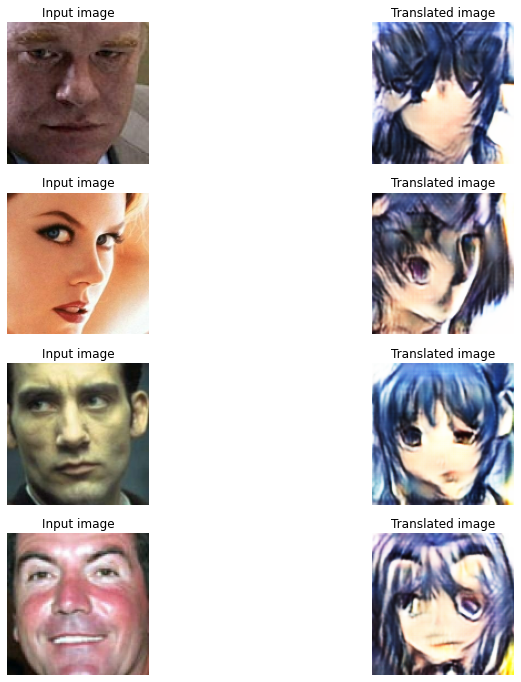

9312/9312 [==============================] - 7302s 784ms/step - G_loss: 3.5662 - F_loss: 3.5822 - D_X_loss: 0.1749 - D_Y_loss: 0.1753
Epoch 2/5
1805/9312 [====>.........................] - ETA: 1:35:10 - G_loss: 2.9746 - F_loss: 3.2522 - D_X_loss: 0.1938 - D_Y_loss: 0.2097

In [37]:
# 256,256 with batch of 1 

cycle_gan_model.fit(
    tf.data.Dataset.zip((augmented_train_human, augmented_train_anime)),
    epochs=5, workers=10,
    callbacks=[plotter, model_checkpoint_callback],
)

Epoch 1/5
2328/2328 [==============================] - ETA: 0s - G_loss: 2.6224 - F_loss: 3.0113 - D_X_loss: 0.1849 - D_Y_loss: 0.2062

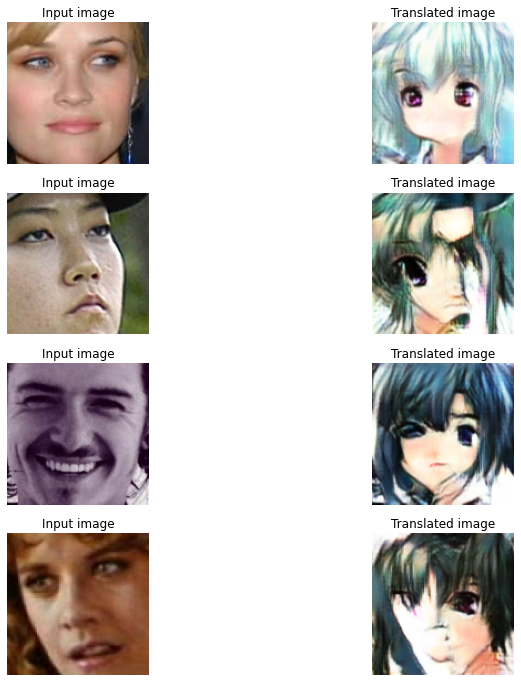

2328/2328 [==============================] - 5042s 2s/step - G_loss: 2.6224 - F_loss: 3.0112 - D_X_loss: 0.1849 - D_Y_loss: 0.2062
Epoch 2/5
1357/2328 [================>.............] - ETA: 33:21 - G_loss: 2.5591 - F_loss: 2.9887 - D_X_loss: 0.1877 - D_Y_loss: 0.2103

In [43]:
# 128,128 with batch of 6  

cycle_gan_model.fit(
    tf.data.Dataset.zip((augmented_train_human, augmented_train_anime)),
    epochs=5, workers=10,
    callbacks=[plotter, model_checkpoint_callback],
)

Run this model above for 90 epochs and save the results. 

In [ ]:
# 64,64 with a batch of 32 

cycle_gan_model.fit(
    tf.data.Dataset.zip((augmented_train_human, augmented_train_anime)),
    epochs=10, workers=10,
    callbacks=[plotter, model_checkpoint_callback],
)

In [ ]:
cycle_gan_model.fit(
    tf.data.Dataset.zip((augmented_train_human, augmented_train_anime)),
    epochs=10, workers=10,
    callbacks=[plotter, model_checkpoint_callback],
)

## Now we can load the latest model checkpoint weights and rerun the model for another 40 epochs see if this improves things.

## Training Run 2

In [ ]:
weight_file = "./model_checkpoints/cyclegan_checkpoints.010"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

cycle_gan_model.fit(
    tf.data.Dataset.zip((augmented_train_human, augmented_train_anime)),
    epochs=60, workers=10,
    callbacks=[plotter, model_checkpoint_callback],
)

## Training Run 3 

We have changed the image size to 128,128 we still have the reduced training set and have now reduced the batch size to 1 as this is what they had in the orignal paper.  

Weights loaded successfully
Epoch 1/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.9545 - F_loss: 3.7092 - D_X_loss: 0.3401 - D_Y_loss: 0.2569

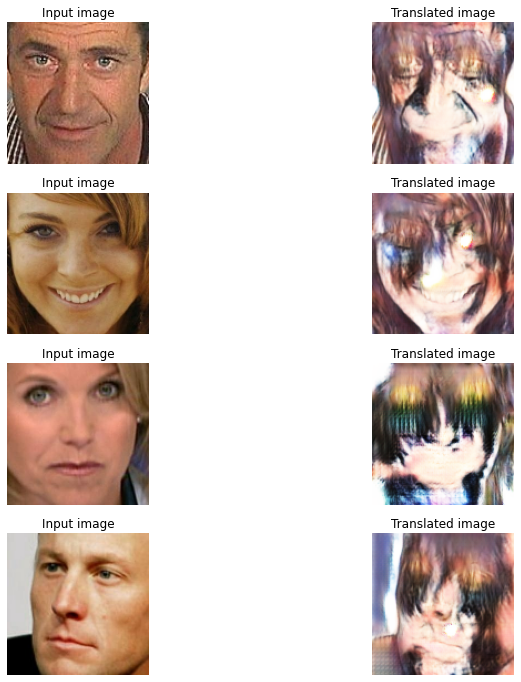

1397/1397 [==============================] - 1832s 1s/step - G_loss: 2.9544 - F_loss: 3.7083 - D_X_loss: 0.3400 - D_Y_loss: 0.2570
Epoch 2/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.5350 - F_loss: 3.3662 - D_X_loss: 0.2241 - D_Y_loss: 0.2287

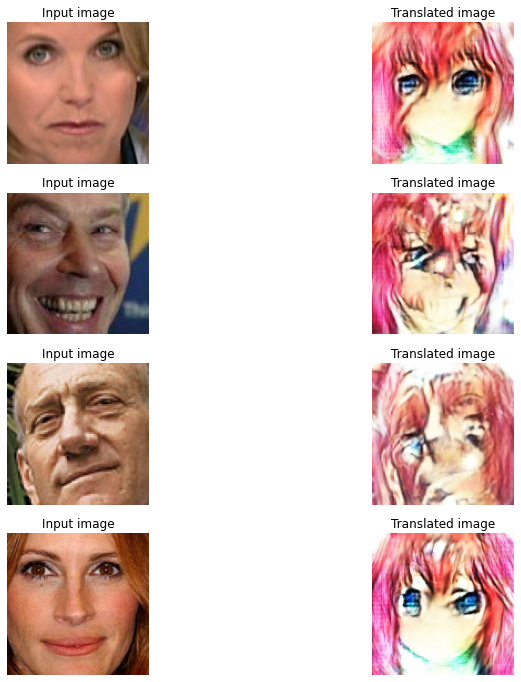

1397/1397 [==============================] - 1777s 1s/step - G_loss: 2.5354 - F_loss: 3.3661 - D_X_loss: 0.2241 - D_Y_loss: 0.2287
Epoch 3/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.5110 - F_loss: 3.2742 - D_X_loss: 0.2190 - D_Y_loss: 0.2246

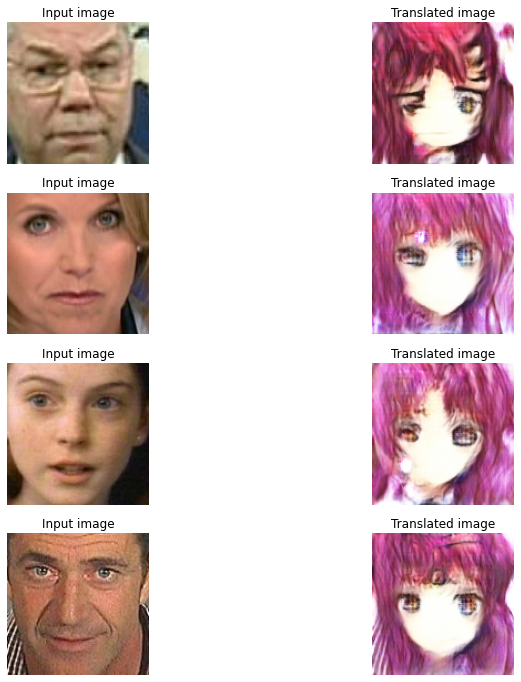

1397/1397 [==============================] - 1704s 1s/step - G_loss: 2.5110 - F_loss: 3.2747 - D_X_loss: 0.2190 - D_Y_loss: 0.2246
Epoch 4/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.4880 - F_loss: 3.1927 - D_X_loss: 0.2172 - D_Y_loss: 0.2239

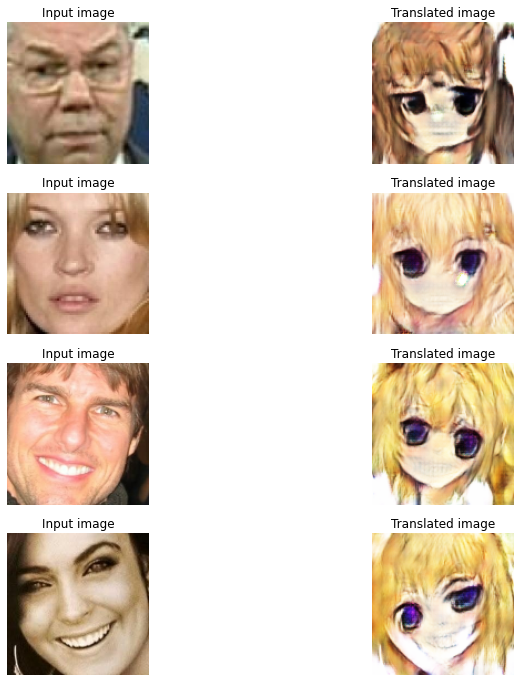

1397/1397 [==============================] - 1714s 1s/step - G_loss: 2.4882 - F_loss: 3.1924 - D_X_loss: 0.2173 - D_Y_loss: 0.2239
Epoch 5/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.4384 - F_loss: 3.0974 - D_X_loss: 0.2141 - D_Y_loss: 0.2223

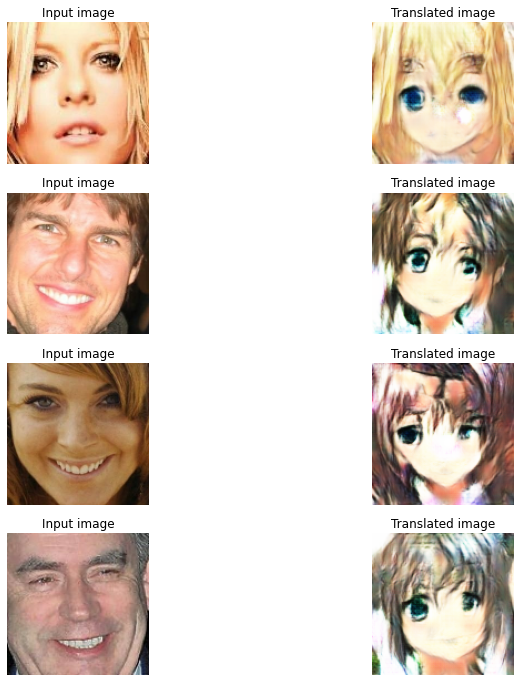

1397/1397 [==============================] - 1714s 1s/step - G_loss: 2.4384 - F_loss: 3.0971 - D_X_loss: 0.2141 - D_Y_loss: 0.2223
Epoch 6/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.4098 - F_loss: 3.0900 - D_X_loss: 0.2112 - D_Y_loss: 0.2248

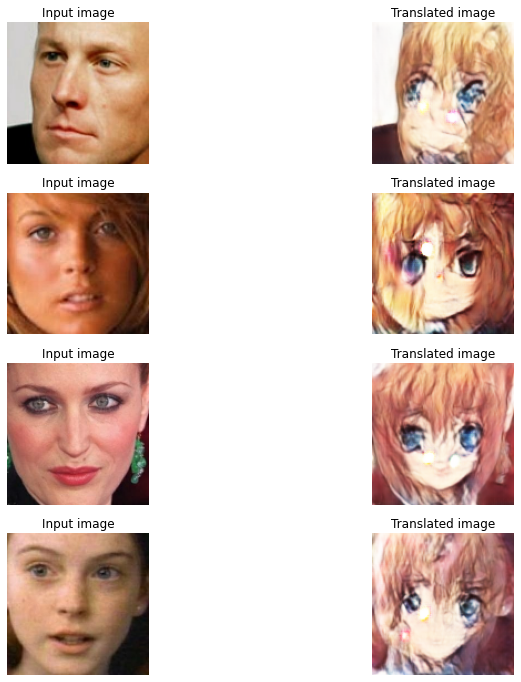

1397/1397 [==============================] - 1791s 1s/step - G_loss: 2.4094 - F_loss: 3.0907 - D_X_loss: 0.2111 - D_Y_loss: 0.2247
Epoch 7/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.4538 - F_loss: 3.0405 - D_X_loss: 0.2095 - D_Y_loss: 0.2241

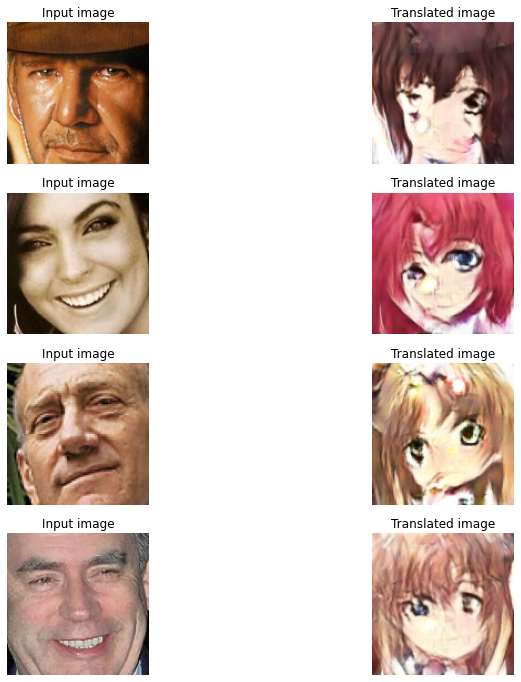

1397/1397 [==============================] - 1852s 1s/step - G_loss: 2.4537 - F_loss: 3.0411 - D_X_loss: 0.2095 - D_Y_loss: 0.2241
Epoch 8/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.4567 - F_loss: 3.0360 - D_X_loss: 0.2074 - D_Y_loss: 0.2225

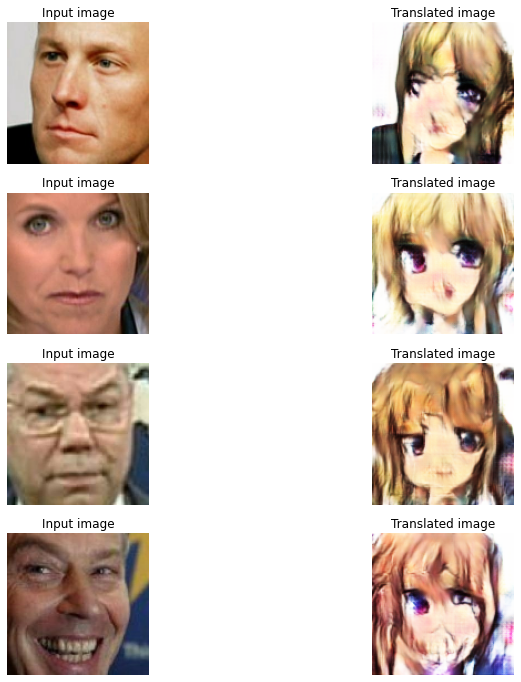

1397/1397 [==============================] - 1924s 1s/step - G_loss: 2.4565 - F_loss: 3.0361 - D_X_loss: 0.2074 - D_Y_loss: 0.2225
Epoch 9/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.4773 - F_loss: 3.0417 - D_X_loss: 0.2053 - D_Y_loss: 0.2194

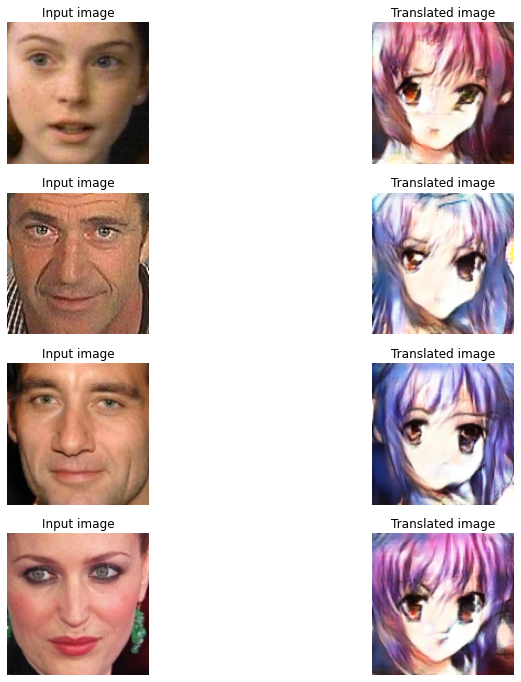

1397/1397 [==============================] - 1694s 1s/step - G_loss: 2.4777 - F_loss: 3.0414 - D_X_loss: 0.2054 - D_Y_loss: 0.2194
Epoch 10/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.4748 - F_loss: 3.0490 - D_X_loss: 0.2022 - D_Y_loss: 0.2181

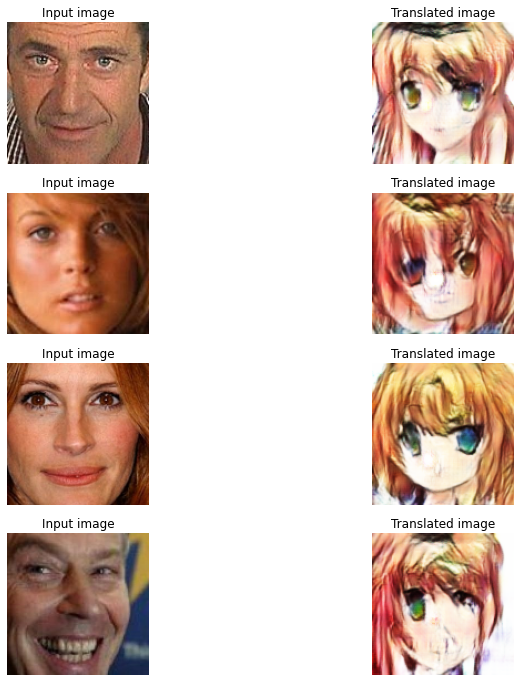

1397/1397 [==============================] - 1700s 1s/step - G_loss: 2.4749 - F_loss: 3.0486 - D_X_loss: 0.2022 - D_Y_loss: 0.2181
Epoch 11/25
1290/1397 [==========================>...] - ETA: 2:07 - G_loss: 2.4220 - F_loss: 3.0278 - D_X_loss: 0.1980 - D_Y_loss: 0.2144

In [16]:
weight_file = "./model_checkpoints2/cyclegan_checkpoints.060"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

cycle_gan_model.fit(
    tf.data.Dataset.zip((augmented_train_human, augmented_train_anime)),
    epochs=25, workers=10,
    callbacks=[plotter, model_checkpoint_callback],
)

## Training Run 4

Weights loaded successfully
Epoch 1/25
1397/1397 [==============================] - ETA: 0s - G_loss: 3.1038 - F_loss: 3.7051 - D_X_loss: 0.2339 - D_Y_loss: 0.2286

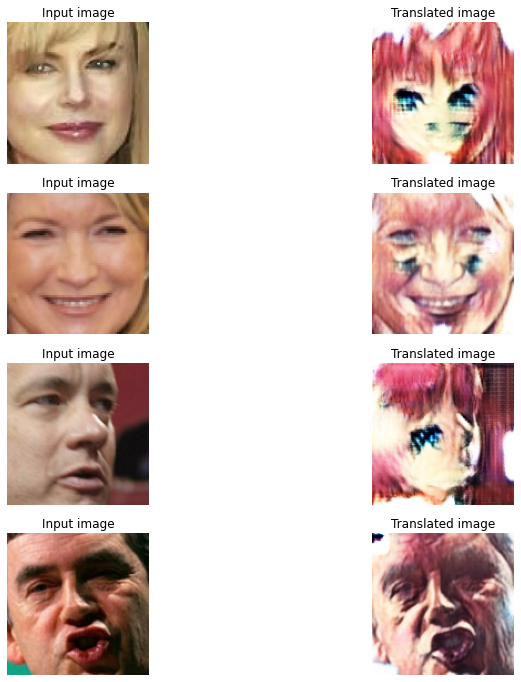

1397/1397 [==============================] - 1789s 1s/step - G_loss: 3.1036 - F_loss: 3.7048 - D_X_loss: 0.2338 - D_Y_loss: 0.2287
Epoch 2/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.8633 - F_loss: 3.5829 - D_X_loss: 0.1997 - D_Y_loss: 0.2114

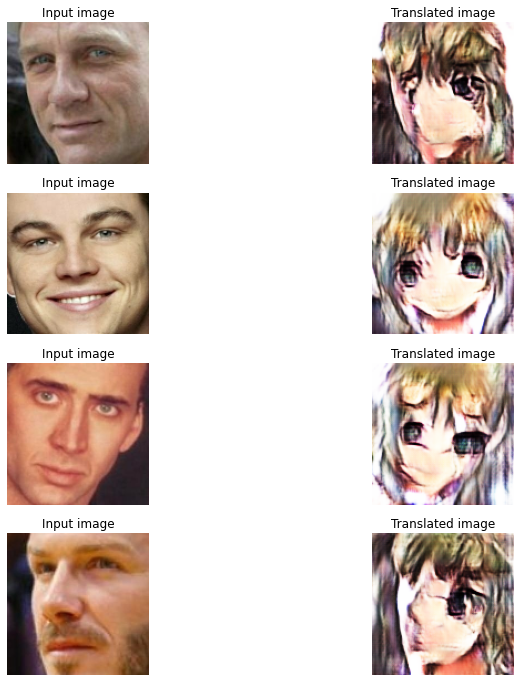

1397/1397 [==============================] - 1710s 1s/step - G_loss: 2.8633 - F_loss: 3.5827 - D_X_loss: 0.1998 - D_Y_loss: 0.2114
Epoch 3/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.7302 - F_loss: 3.4763 - D_X_loss: 0.1993 - D_Y_loss: 0.2201

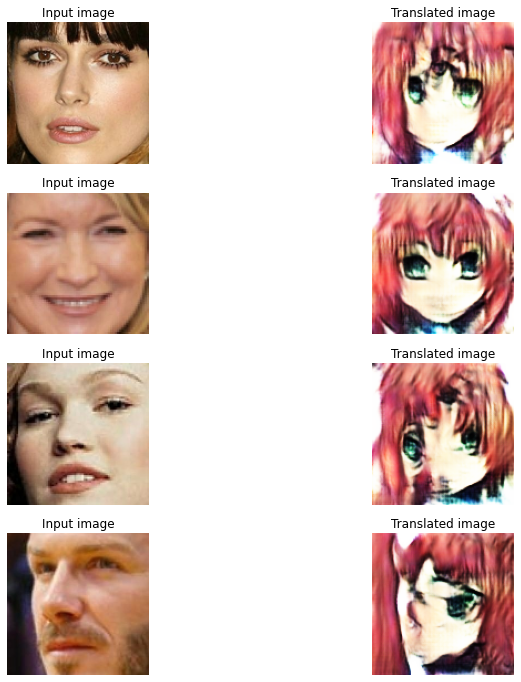

1397/1397 [==============================] - 1682s 1s/step - G_loss: 2.7301 - F_loss: 3.4766 - D_X_loss: 0.1992 - D_Y_loss: 0.2201
Epoch 4/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.7131 - F_loss: 3.3525 - D_X_loss: 0.2019 - D_Y_loss: 0.2162

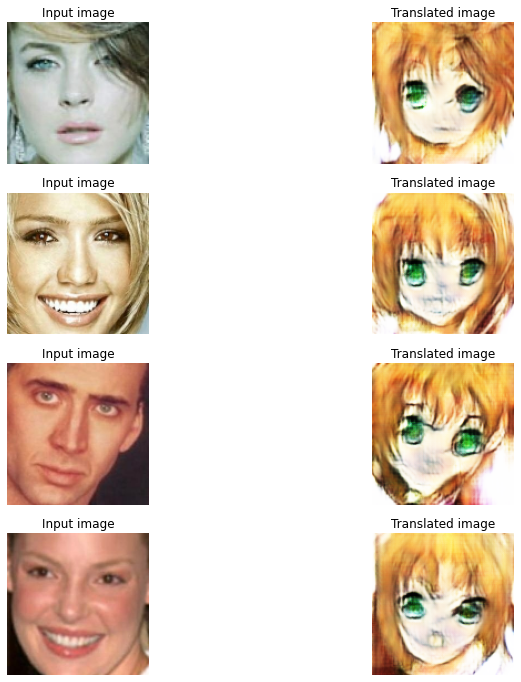

1397/1397 [==============================] - 1674s 1s/step - G_loss: 2.7126 - F_loss: 3.3522 - D_X_loss: 0.2019 - D_Y_loss: 0.2162
Epoch 5/25
 426/1397 [========>.....................] - ETA: 19:28 - G_loss: 2.5952 - F_loss: 3.2856 - D_X_loss: 0.2028 - D_Y_loss: 0.2138

In [18]:
weight_file = "./model_checkpoints2/cyclegan_checkpoints.020"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

cycle_gan_model.fit(
    tf.data.Dataset.zip((augmented_train_human, augmented_train_anime)),
    epochs=25, workers=10,
    callbacks=[plotter, model_checkpoint_callback],
)

## Training Run 5 

Weights loaded successfully
Epoch 1/25
932/932 [==============================] - ETA: 0s - G_loss: 2.4944 - F_loss: 3.0432 - D_X_loss: 0.2115 - D_Y_loss: 0.2218

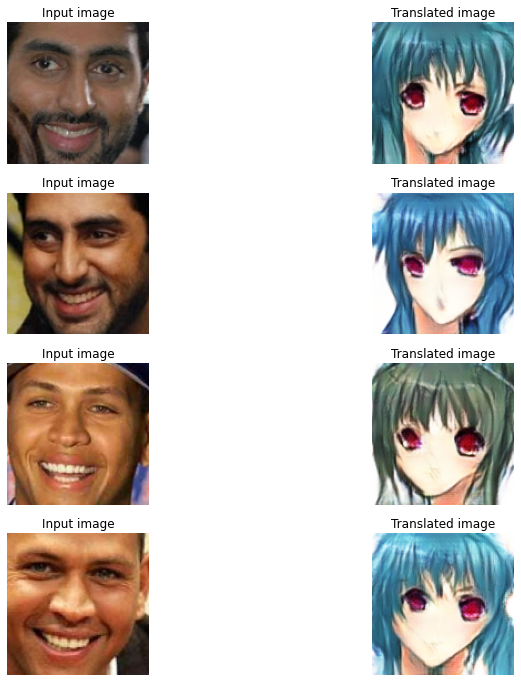

932/932 [==============================] - 1195s 1s/step - G_loss: 2.4945 - F_loss: 3.0423 - D_X_loss: 0.2114 - D_Y_loss: 0.2217
Epoch 2/25
932/932 [==============================] - ETA: 0s - G_loss: 2.4723 - F_loss: 3.0301 - D_X_loss: 0.2058 - D_Y_loss: 0.2184

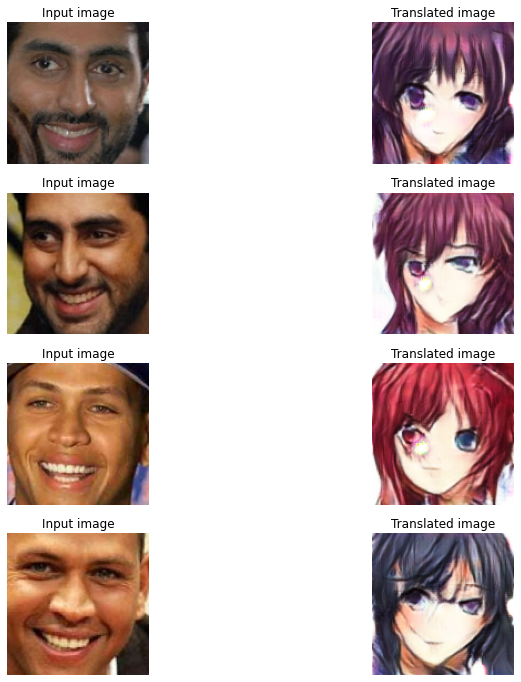

932/932 [==============================] - 1162s 1s/step - G_loss: 2.4719 - F_loss: 3.0311 - D_X_loss: 0.2058 - D_Y_loss: 0.2185
Epoch 3/25
932/932 [==============================] - ETA: 0s - G_loss: 2.4948 - F_loss: 3.0432 - D_X_loss: 0.2058 - D_Y_loss: 0.2166

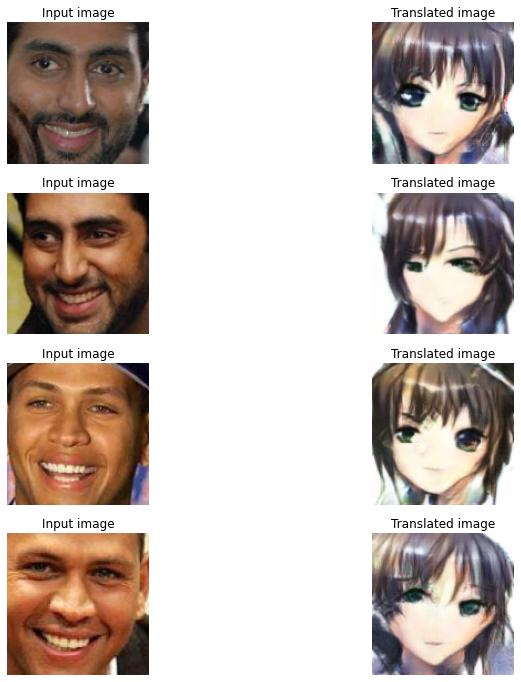

932/932 [==============================] - 1117s 1s/step - G_loss: 2.4948 - F_loss: 3.0424 - D_X_loss: 0.2058 - D_Y_loss: 0.2165
Epoch 4/25
655/932 [====================>.........] - ETA: 5:22 - G_loss: 2.4614 - F_loss: 3.0041 - D_X_loss: 0.2031 - D_Y_loss: 0.2191

In [25]:
weight_file = "./model_checkpoints4/cyclegan_checkpoints.017"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

cycle_gan_model.fit(
    tf.data.Dataset.zip((augmented_train_human, augmented_train_anime)),
    epochs=25, workers=10,
    callbacks=[plotter, model_checkpoint_callback],
)

## Training Run 6

Weights loaded successfully
Epoch 1/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.6756 - F_loss: 2.9583 - D_X_loss: 0.2091 - D_Y_loss: 0.2127

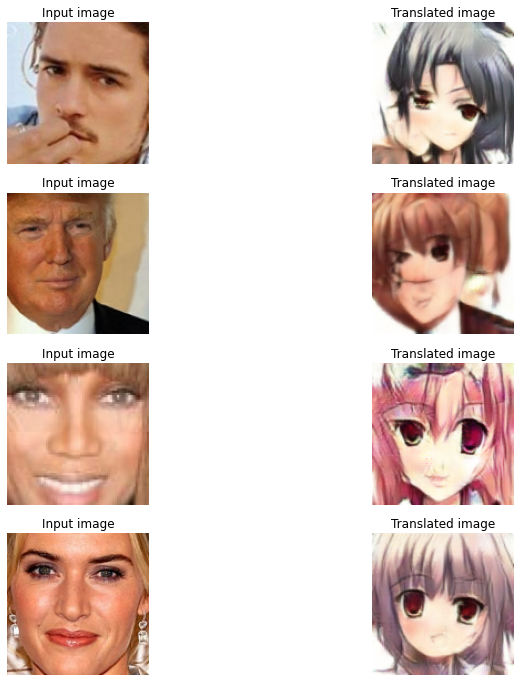

1397/1397 [==============================] - 1730s 1s/step - G_loss: 2.6753 - F_loss: 2.9584 - D_X_loss: 0.2091 - D_Y_loss: 0.2128
Epoch 2/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.6309 - F_loss: 2.9500 - D_X_loss: 0.2042 - D_Y_loss: 0.2077

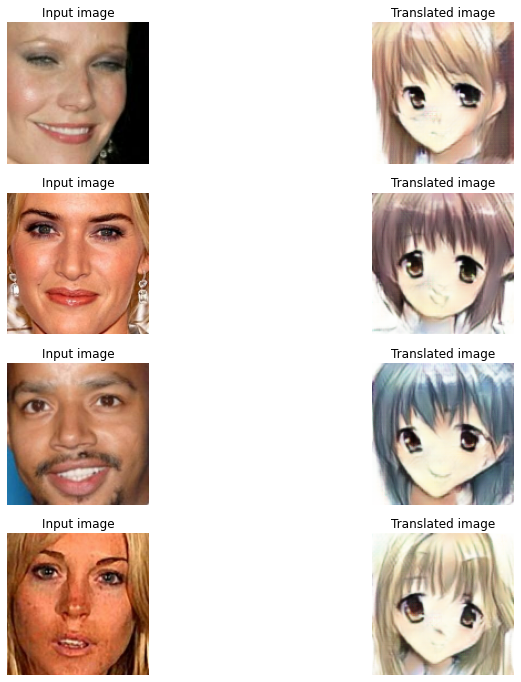

1397/1397 [==============================] - 1772s 1s/step - G_loss: 2.6312 - F_loss: 2.9501 - D_X_loss: 0.2042 - D_Y_loss: 0.2077
Epoch 3/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.6713 - F_loss: 2.9119 - D_X_loss: 0.2039 - D_Y_loss: 0.2048

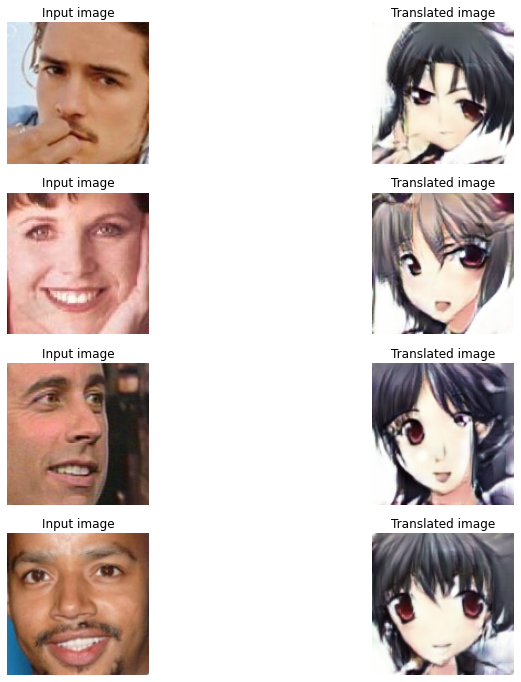

1397/1397 [==============================] - 1659s 1s/step - G_loss: 2.6711 - F_loss: 2.9122 - D_X_loss: 0.2039 - D_Y_loss: 0.2048
Epoch 4/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.6705 - F_loss: 2.9175 - D_X_loss: 0.2012 - D_Y_loss: 0.2024

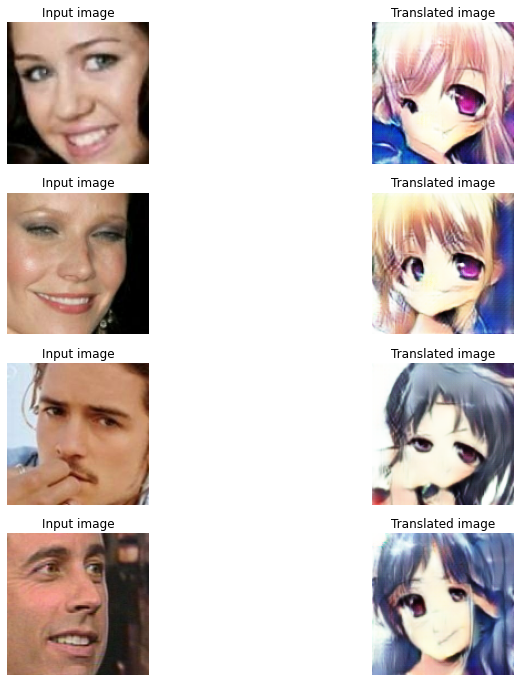

1397/1397 [==============================] - 1678s 1s/step - G_loss: 2.6708 - F_loss: 2.9179 - D_X_loss: 0.2012 - D_Y_loss: 0.2024
Epoch 5/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.6962 - F_loss: 2.9270 - D_X_loss: 0.1980 - D_Y_loss: 0.1963

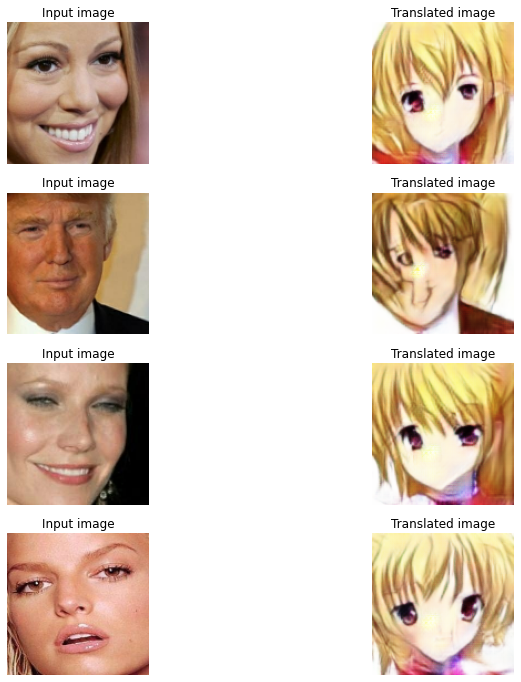

1397/1397 [==============================] - 1646s 1s/step - G_loss: 2.6965 - F_loss: 2.9269 - D_X_loss: 0.1980 - D_Y_loss: 0.1963
Epoch 6/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.7109 - F_loss: 2.8974 - D_X_loss: 0.1965 - D_Y_loss: 0.1932

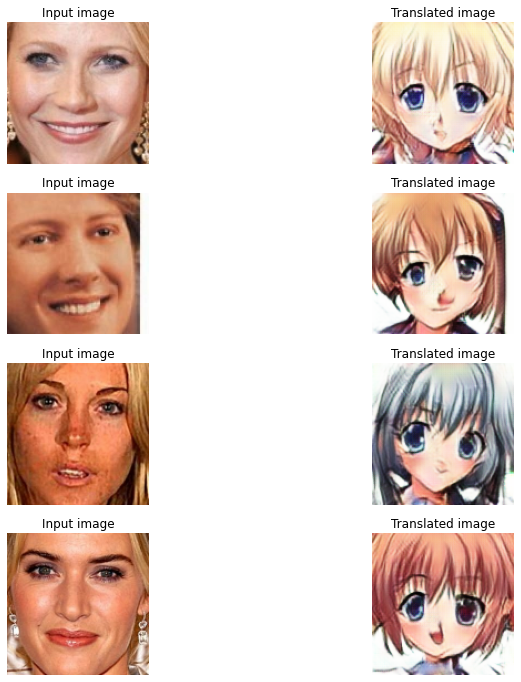

1397/1397 [==============================] - 1661s 1s/step - G_loss: 2.7107 - F_loss: 2.8970 - D_X_loss: 0.1965 - D_Y_loss: 0.1932
Epoch 7/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.6775 - F_loss: 2.9162 - D_X_loss: 0.1978 - D_Y_loss: 0.1914

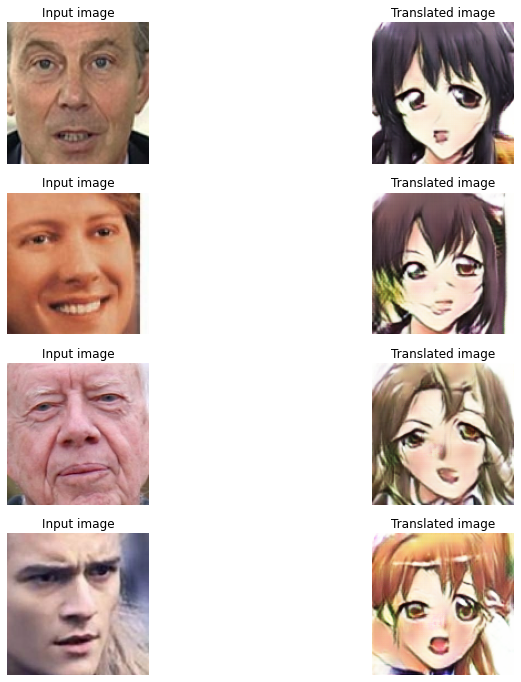

1397/1397 [==============================] - 1648s 1s/step - G_loss: 2.6775 - F_loss: 2.9162 - D_X_loss: 0.1979 - D_Y_loss: 0.1913
Epoch 8/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.7351 - F_loss: 2.9286 - D_X_loss: 0.1944 - D_Y_loss: 0.1913

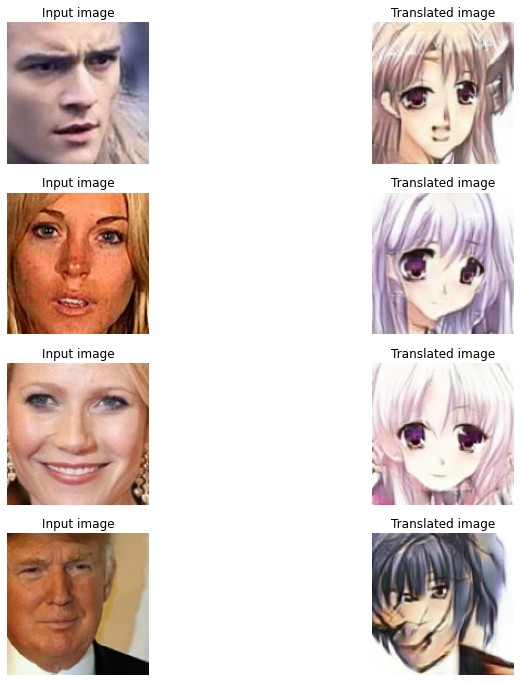

1397/1397 [==============================] - 1659s 1s/step - G_loss: 2.7351 - F_loss: 2.9285 - D_X_loss: 0.1944 - D_Y_loss: 0.1913
Epoch 9/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.7285 - F_loss: 2.8968 - D_X_loss: 0.1951 - D_Y_loss: 0.1883

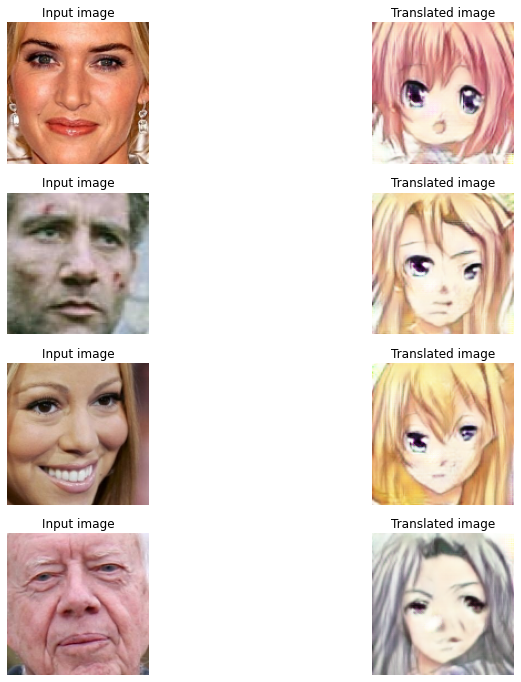

1397/1397 [==============================] - 1641s 1s/step - G_loss: 2.7286 - F_loss: 2.8966 - D_X_loss: 0.1951 - D_Y_loss: 0.1883
Epoch 10/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.7356 - F_loss: 2.8580 - D_X_loss: 0.1942 - D_Y_loss: 0.1880

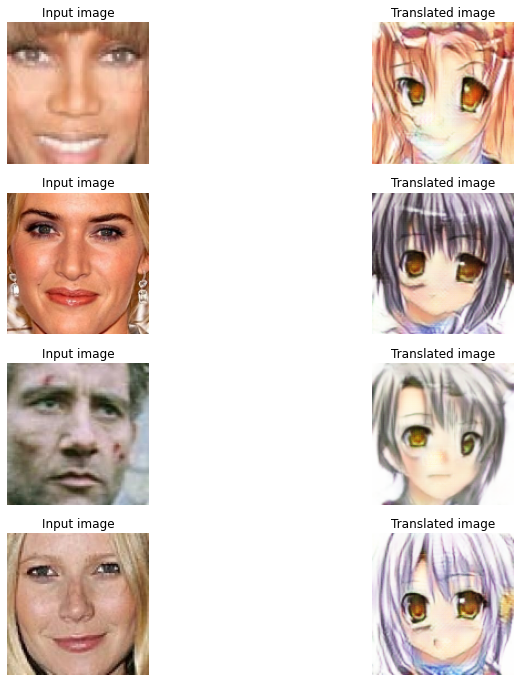

1397/1397 [==============================] - 1661s 1s/step - G_loss: 2.7357 - F_loss: 2.8579 - D_X_loss: 0.1941 - D_Y_loss: 0.1880
Epoch 11/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.7490 - F_loss: 2.8841 - D_X_loss: 0.1936 - D_Y_loss: 0.1858

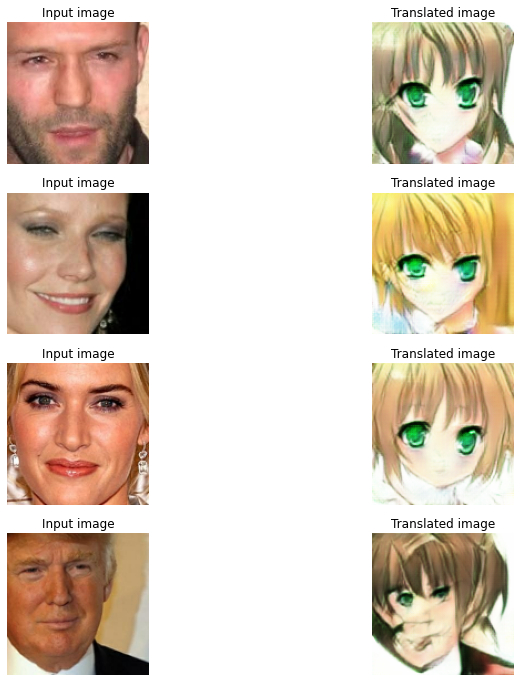

1397/1397 [==============================] - 1650s 1s/step - G_loss: 2.7491 - F_loss: 2.8840 - D_X_loss: 0.1936 - D_Y_loss: 0.1858
Epoch 12/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.7528 - F_loss: 2.8541 - D_X_loss: 0.1902 - D_Y_loss: 0.1824

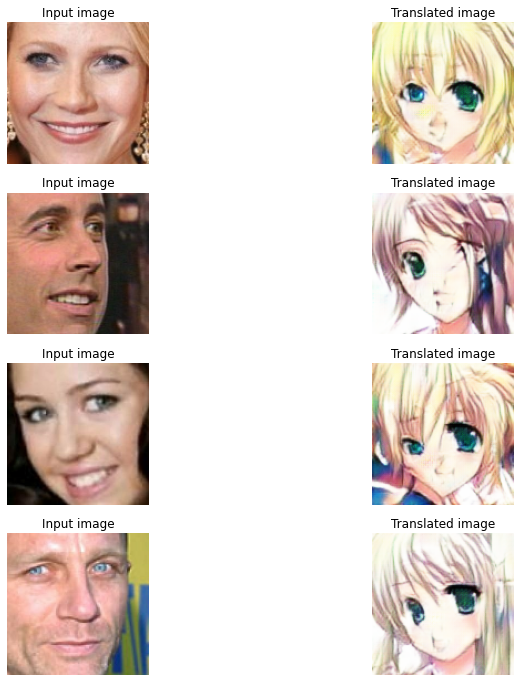

1397/1397 [==============================] - 1650s 1s/step - G_loss: 2.7527 - F_loss: 2.8542 - D_X_loss: 0.1902 - D_Y_loss: 0.1823
Epoch 13/25
 388/1397 [=======>......................] - ETA: 19:55 - G_loss: 2.7498 - F_loss: 2.8469 - D_X_loss: 0.1943 - D_Y_loss: 0.1794

In [14]:
weight_file = "./model_checkpoints5/cyclegan_checkpoints.023"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

cycle_gan_model.fit(
    tf.data.Dataset.zip((augmented_train_human, augmented_train_anime)),
    epochs=25, workers=10,
    callbacks=[plotter, model_checkpoint_callback],
)

## Training Run 7 (Final Run - Due to time constraints)

Weights loaded successfully
Epoch 1/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.8141 - F_loss: 2.8959 - D_X_loss: 0.2055 - D_Y_loss: 0.1979

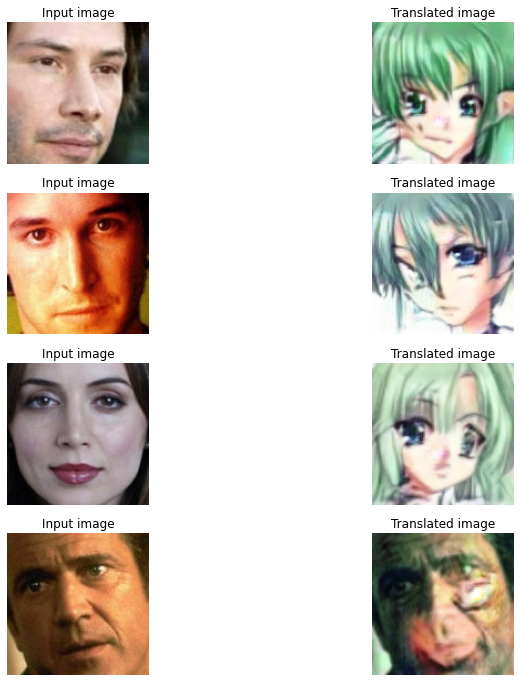

1397/1397 [==============================] - 1693s 1s/step - G_loss: 2.8139 - F_loss: 2.8958 - D_X_loss: 0.2055 - D_Y_loss: 0.1979
Epoch 2/25
1397/1397 [==============================] - ETA: 0s - G_loss: 2.7826 - F_loss: 2.8747 - D_X_loss: 0.2027 - D_Y_loss: 0.1955

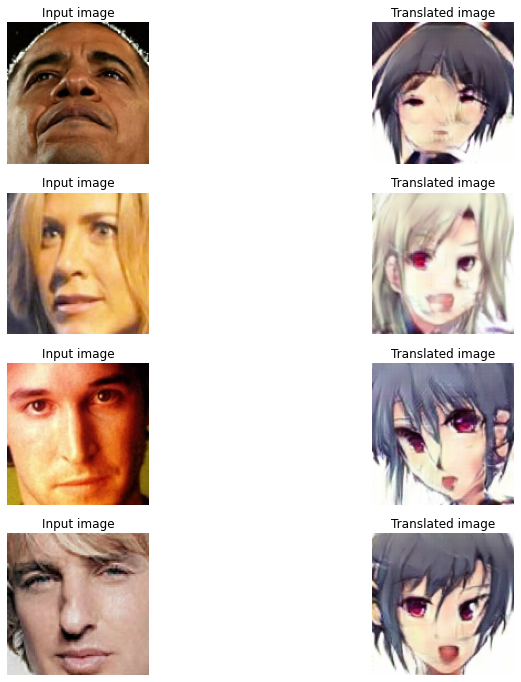

1397/1397 [==============================] - 1678s 1s/step - G_loss: 2.7824 - F_loss: 2.8757 - D_X_loss: 0.2027 - D_Y_loss: 0.1956
Epoch 3/25
1037/1397 [=====================>........] - ETA: 7:00 - G_loss: 2.7659 - F_loss: 2.8751 - D_X_loss: 0.2002 - D_Y_loss: 0.1915

In [13]:
weight_file = "./model_checkpoints6/cyclegan_checkpoints.018"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

cycle_gan_model.fit(
    tf.data.Dataset.zip((augmented_train_human, augmented_train_anime)),
    epochs=25, workers=10,
    callbacks=[plotter, model_checkpoint_callback],
)


____
# Generating Results 

## End of run 1

### Load the checkpoints from the model weve just ran and make some predictions (Turn the test image into an anime style)

Weights loaded successfully


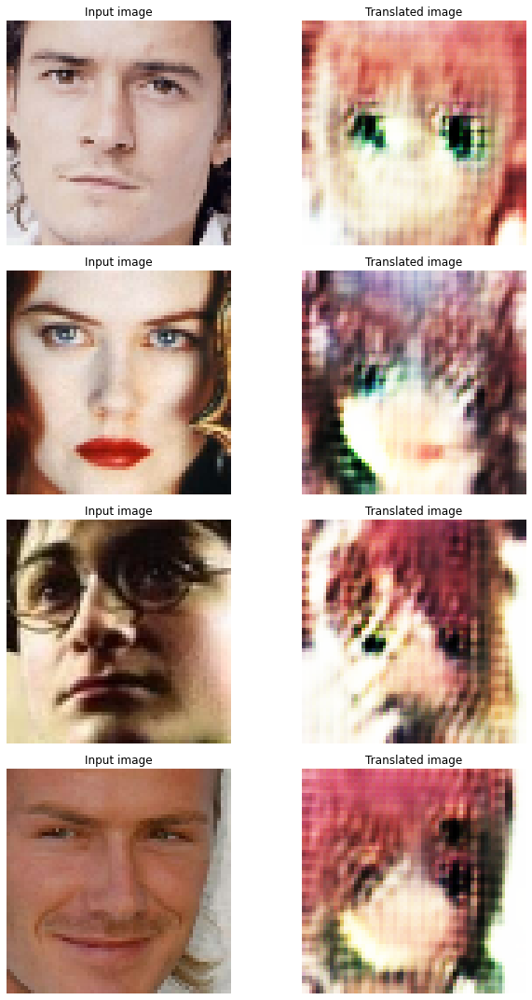

In [44]:
# Load the checkpoints
weight_file = "./model_checkpoints/cyclegan_checkpoints.002"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(augmented_test_human.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()


## This function will access the webcam and snap a picture of you for us to use the cycleGAN to stylise. NB. Only works on python on a local machine not a remote instance. 

## End of run 2

Weights loaded successfully


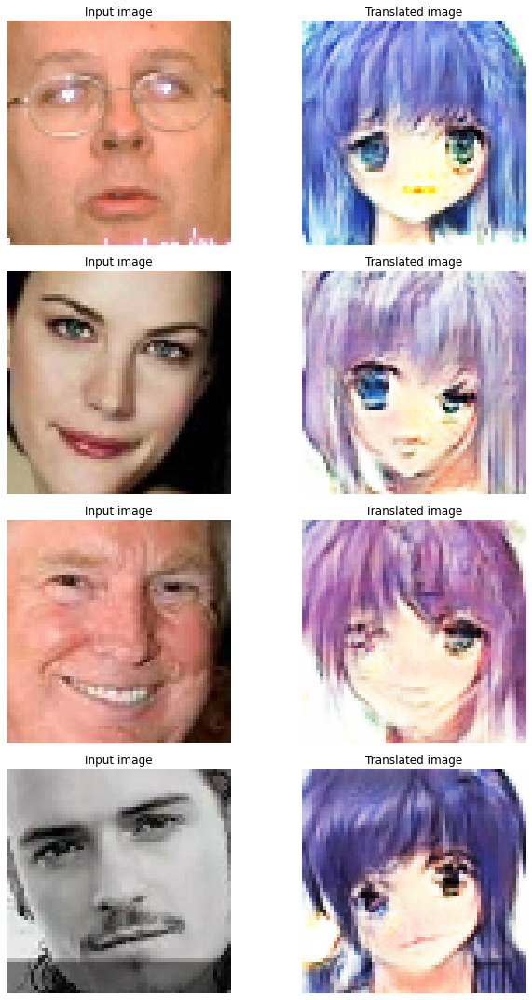

In [31]:
# Load the checkpoints
weight_file = "./model_checkpoints2/cyclegan_checkpoints.060"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(augmented_test_human.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

### End of run 3

Weights loaded successfully


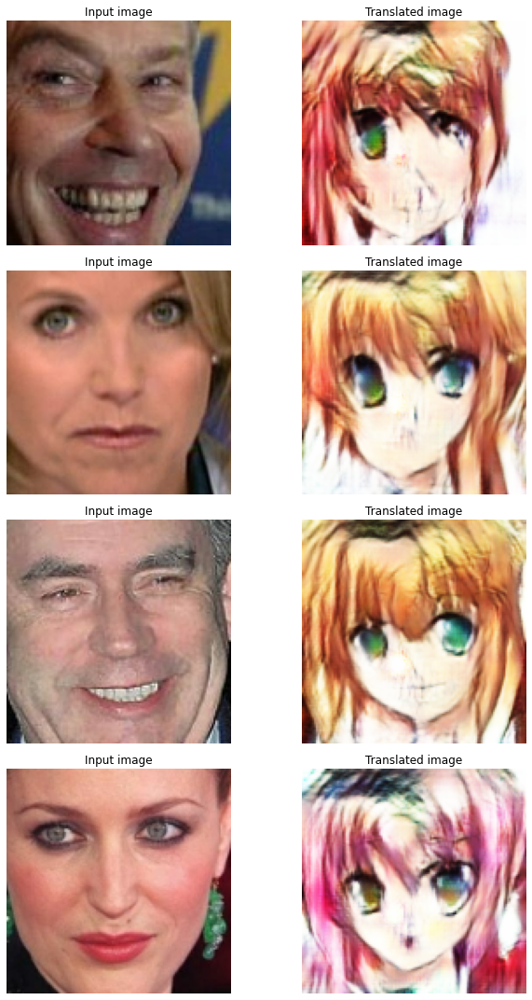

In [19]:
# Load the checkpoints
weight_file = "./model_checkpoints3/cyclegan_checkpoints.020"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(augmented_test_human.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

Weights loaded successfully


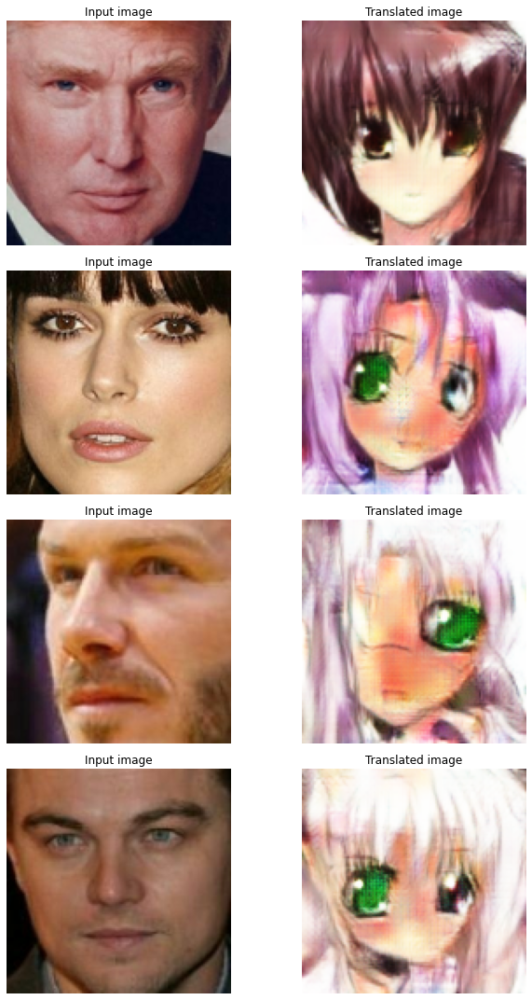

In [14]:
# Load the checkpoints
weight_file = "./model_checkpoints3/cyclegan_checkpoints.020"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(augmented_test_human.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

### End of run 4 (Bar stopped at 5 epochs but have weights files for until 17)

Weights loaded successfully


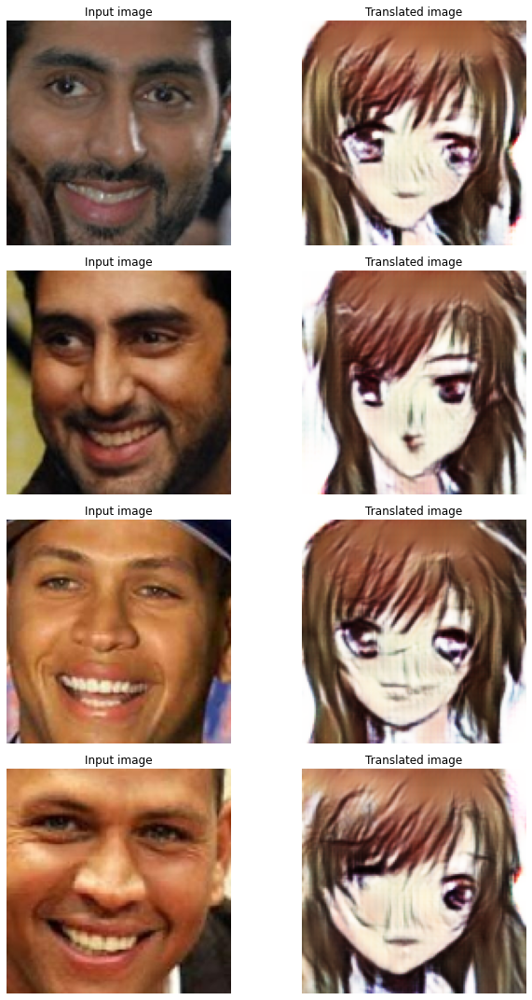

In [18]:
# Load the checkpoints
weight_file = "./model_checkpoints4/cyclegan_checkpoints.017"
cycle_gan_model.load_weights(weight_file).expect_partial()
print("Weights loaded successfully")

_, ax = plt.subplots(4, 2, figsize=(10, 15))
for i, img in enumerate(augmented_test_human.take(4)):
    prediction = cycle_gan_model.gen_G(img, training=False)[0].numpy()
    prediction = (prediction * 127.5 + 127.5).astype(np.uint8)
    img = (img[0] * 127.5 + 127.5).numpy().astype(np.uint8)

    ax[i, 0].imshow(img)
    ax[i, 1].imshow(prediction)
    ax[i, 0].set_title("Input image")
    ax[i, 0].set_title("Input image")
    ax[i, 1].set_title("Translated image")
    ax[i, 0].axis("off")
    ax[i, 1].axis("off")

    prediction = keras.preprocessing.image.array_to_img(prediction)
    prediction.save("predicted_img_{i}.png".format(i=i))
plt.tight_layout()
plt.show()

## End of Run 5